In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot
from plotly.subplots import make_subplots

In [5]:
init_notebook_mode(connected=True)

In [6]:
train_data = pd.read_csv(".././data/raw/train.csv", index_col=0)
print(train_data.shape)
train_data.head()

(48549, 10)


,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
6,0.24,Very Good,J,VVS2,62.8,57.0,336,3.94,3.96,2.48


First of all, let's check data's info.

In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 48549 entries, 1 to 53943
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    48549 non-null  float64
 1   cut      48549 non-null  object 
 2   color    48549 non-null  object 
 3   clarity  48549 non-null  object 
 4   depth    48549 non-null  float64
 5   table    48549 non-null  float64
 6   price    48549 non-null  int64  
 7   x        48549 non-null  float64
 8   y        48549 non-null  float64
 9   z        48549 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


There are no nan values, so there is no need to fill missing values.

Now let's talk about features.

## Features

In [8]:
categorical_features = ["cut", "color", "clarity"]
numerical_features = ["carat", "depth", "table", "x", "y", "z"]

### Categorical

#### Cut

In [6]:
print(list(set(train_data["cut"])))

['Very Good', 'Good', 'Ideal', 'Premium', 'Fair']


There are only 5 unique values. Also they are definitely ordered: Ideal > Premium > Very Good > Good > Fair. 
Let's check this suggestion.

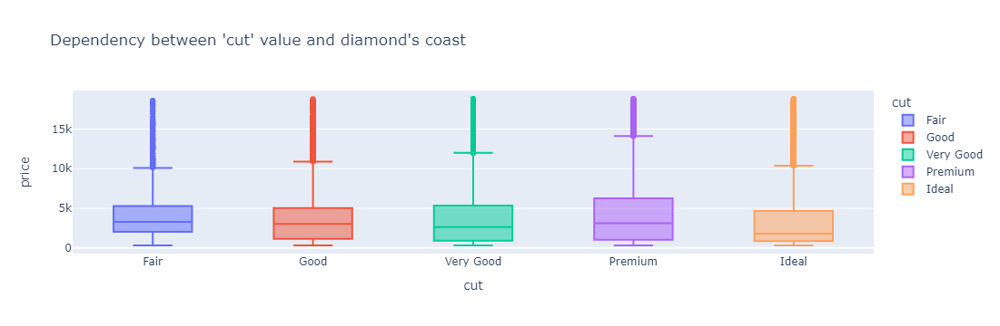

In [25]:
figure = px.box(train_data,
             x = "cut",
             y = "price",
             color = "cut",
             title = "Dependency between 'cut' value and diamond's coast",
             category_orders = {"cut": ["Fair", "Good", "Very Good", "Premium", "Ideal"]})

figure.show()

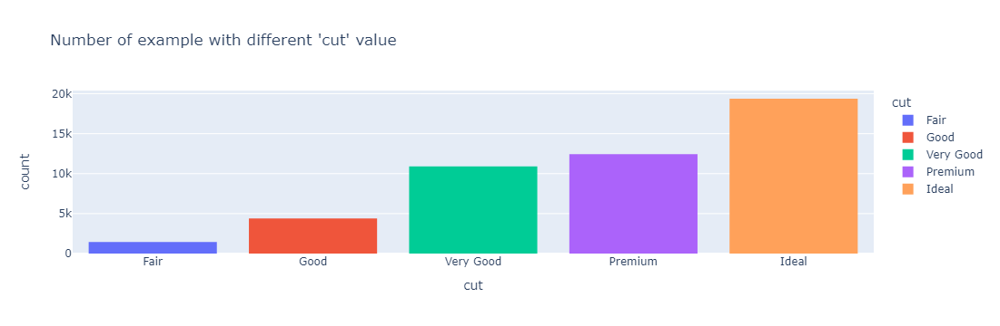

In [26]:
figure = px.histogram(train_data,
                      x = "cut",
                      color = "cut",
                      title = "Number of example with different 'cut' value",
                      category_orders = {"cut": ["Fair", "Good", "Very Good", "Premium", "Ideal"]})
figure.show()

As you can see there is no direct correlation between 'cut' type and price of a dimond. Cause I can't say that 'Ideal' is better than anyone else. It even seems to be worse than any other type. Also 'Perfect' seems to be the best one. With respect to my suggestion 'Fair' should be worse than 'Good' and 'Very Good', but it has better values than another 2 types. So we can't say anything about connection between diamond's 'cut' type and its price.

Also there is a [page](https://www.diamonds.pro/education/cuts/) with expert explanation, but my investigation can't approve this information.

#### Color

In [37]:
print(list(set(train_data["color"])))

['D', 'I', 'G', 'J', 'E', 'H', 'F']


Once again, there is a finite number of unique values.

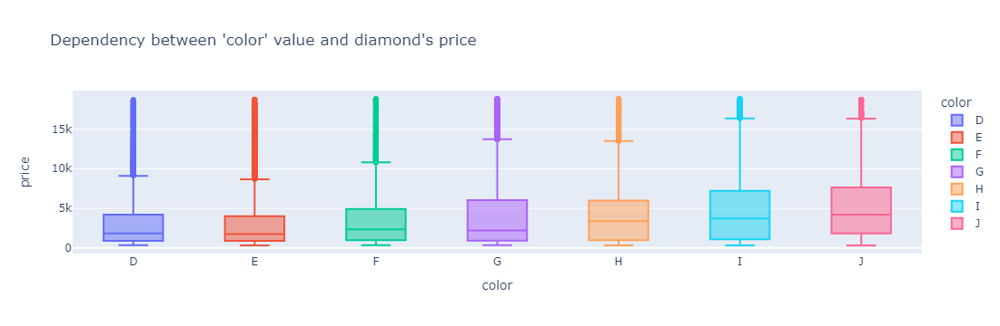

In [40]:
figure = px.box(train_data,
             x = "color",
             y = "price",
             color = "color",
             title = "Dependency between 'color' value and diamond's price",
             category_orders = {"color": ["D", "E", "F", "G", "H", "I", "J"]})

figure.show()

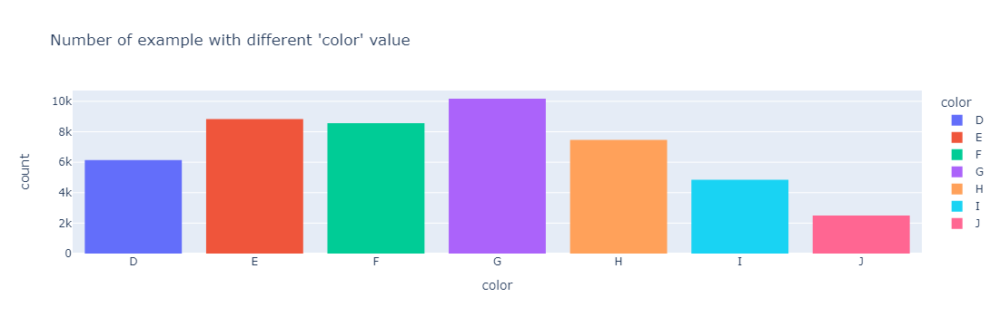

In [30]:
figure = px.histogram(train_data,
                      x = "color",
                      color = "color",
                      title = "Number of example with different 'color' value",
                      category_orders = {"color": ["D", "E", "F", "G", "H", "I", "J"]})
figure.show()

It's very strange but "color" definitely has a positive connection with price, for example, this [page](https://www.brilliantearth.com/diamond/buying-guide/color/). May be there is a connection like: "there are no any diamonds with 'D' color which is big, but diamond with 'J' color can be enormous" so they may coast so much.

#### Clarity

In [38]:
print(list(set(train_data["clarity"])))

['I1', 'VVS1', 'IF', 'VVS2', 'SI2', 'VS1', 'VS2', 'SI1']


As I've found [there](https://4cs.gia.edu/en-us/diamond-clarity/) these values also can be ordered

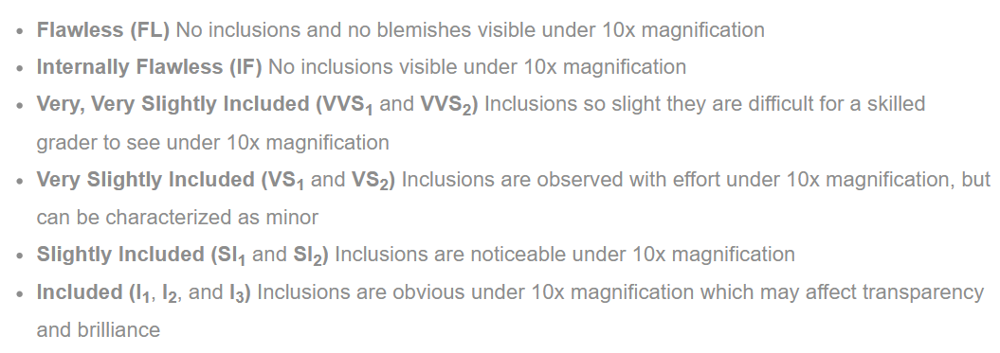

So let's see, is there a connection with price or no.

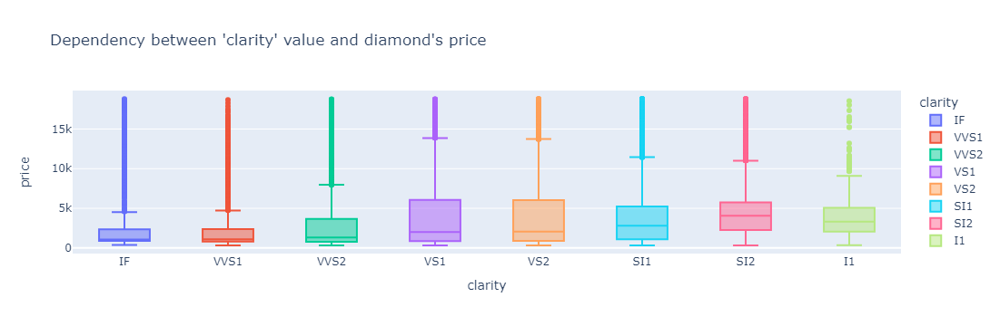

In [41]:
figure = px.box(train_data,
             x = "clarity",
             y = "price",
             color = "clarity",
             title = "Dependency between 'clarity' value and diamond's price",
             category_orders = {"clarity": ["IF", "VVS1", "VVS2", "VS1", "VS2", "SI1", "SI2", "I1"]})

figure.show()

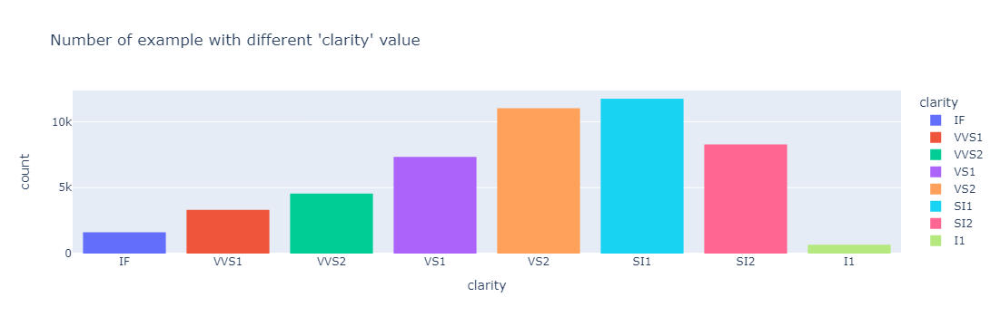

In [43]:
figure = px.histogram(train_data,
                      x = "clarity",
                      color = "clarity",
                      title = "Number of example with different 'clarity' value",
                      category_orders = {"clarity": ["IF", "VVS1", "VVS2", "VS1", "VS2", "SI1", "SI2", "I1"]})
figure.show()

Once again, I can't explain it, but worse 'clarity' usually means better price :) 

### Numerical

First of all, let's check Pirson's correlation between features. 

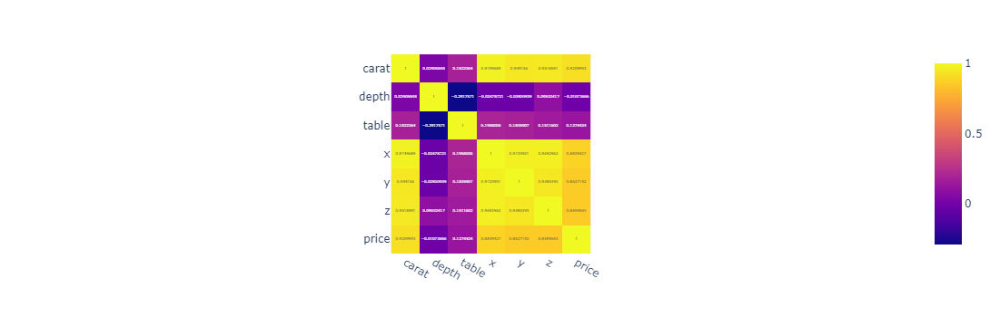

In [49]:
figure = px.imshow(train_data[numerical_features + ["price"]].corr(), text_auto=True)

figure.show()

So, there are some news:
1. 'carat' has very good correlation with 'price', so we can rely on it;
2. 'carat', 'x', 'y' and 'z' - they all have high correlation, so it can be a problem for linear models. This effect can be explained - these features represent linear size of a diamond;

Now let's precisely look at every feature.

#### Carat

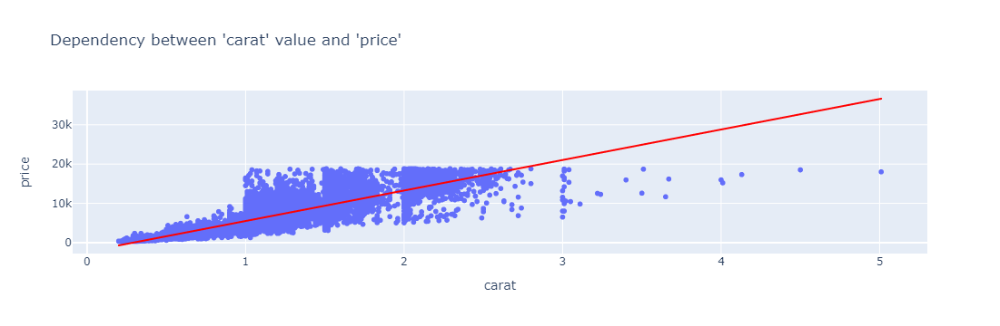

In [58]:
figure = px.scatter(train_data,
                    x = "carat",
                    y = "price",
                    trendline = "ols",
                    trendline_color_override = "red",
                    title="Dependency between 'carat' value and 'price'")

figure.show()

So as I've mentioned earlier, for sure there is good connection between these 2 variables.

#### Depth & Table

As you can see below, these 2 features have something in common so we'll look at both of them together.

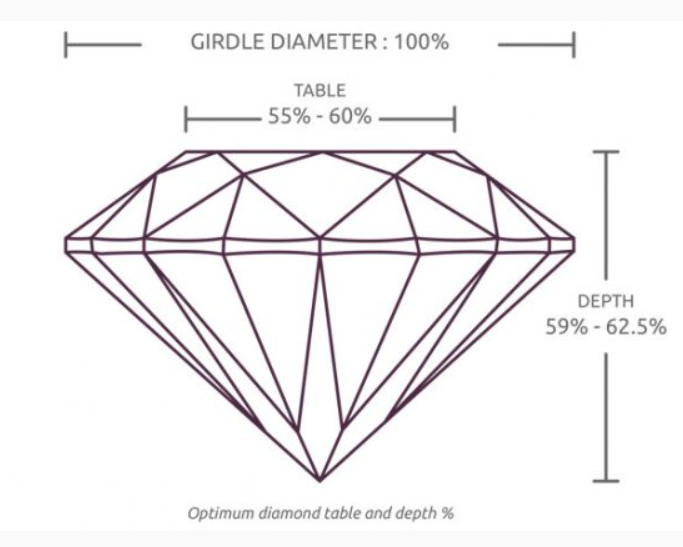

Please note that there are a lot of point so this cell will decrease your browser speed a lot.

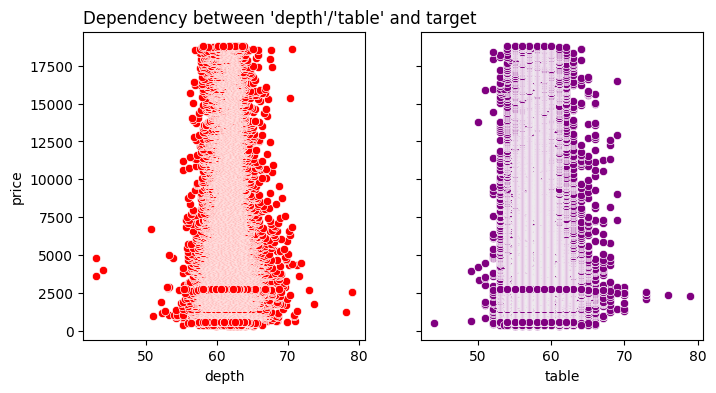

In [53]:
fig, axs = plt.subplots(1, 2, sharey = True)
fig.set_size_inches(8, 4)

sns.scatterplot(data = train_data, x = "depth", y = "price", palette = "deep", ax = axs[0], color = "red")
sns.scatterplot(data = train_data, x = "table", y = "price", palette = "deep", ax = axs[1], color = "purple")

axs[0].set_title("Dependency between 'depth'/'table' and target", loc = "left")
plt.show()

As we can see there is no correlation between diamond's depth/table and its price.

#### x, y & z

Since all of these features are about linear size, it's logical to look at them together.

In [60]:
palette = iter(sns.color_palette("Set2"))

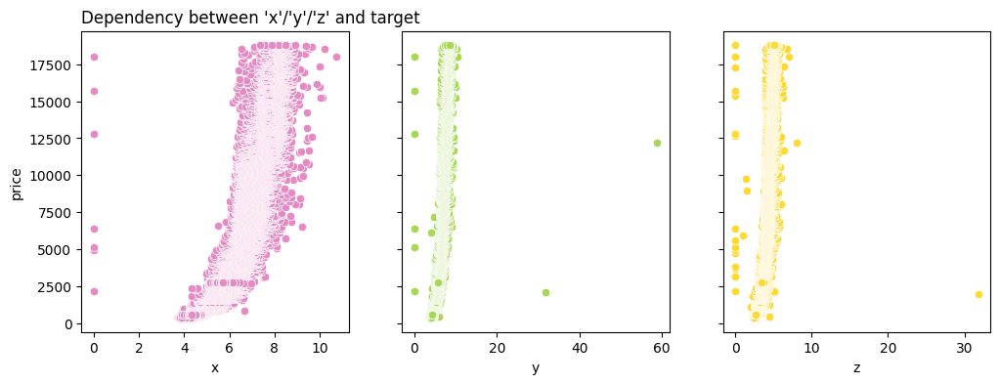

In [62]:
fig, axs = plt.subplots(1, 3, sharey = True)
fig.set_size_inches(12, 4)

sns.scatterplot(data = train_data, x = "x", y = "price", palette = "deep", ax = axs[0], color = next(palette))
sns.scatterplot(data = train_data, x = "y", y = "price", palette = "deep", ax = axs[1], color = next(palette))
sns.scatterplot(data = train_data, x = "z", y = "price", palette = "deep", ax = axs[2], color = next(palette))


axs[0].set_title("Dependency between 'x'/'y'/'z' and target", loc = "left")
plt.show()

For sure there is a correlation, but as we've seen above, it's not very big.